In [1]:
import os
os.environ['LD_LIBRARY_PATH'] = '/usr/local/cuda/lib64:' + os.environ.get('LD_LIBRARY_PATH', '')


In [2]:
import os
print("LD_LIBRARY_PATH:", os.environ.get('LD_LIBRARY_PATH'))


LD_LIBRARY_PATH: /usr/local/cuda/lib64:


In [3]:
import tensorflow as tf
print("GPUs detected:", tf.config.list_physical_devices('GPU'))


2025-06-10 00:43:06.640302: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2025-06-10 00:43:06.656298: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:467] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1749534186.669465    4543 cuda_dnn.cc:8579] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1749534186.673206    4543 cuda_blas.cc:1407] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
W0000 00:00:1749534186.684280    4543 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking 

GPUs detected: [PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]


In [4]:
import os
import datetime
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.utils.class_weight import compute_class_weight

import tensorflow as tf
from tensorflow.keras import backend as K
from tensorflow import keras
from tensorflow.keras import layers, models #type: ignore
from tensorflow.keras.applications import ResNet50  #type: ignore
from tensorflow.keras.preprocessing.image import load_img, img_to_array, ImageDataGenerator #type: ignore
from tensorflow.keras.utils import to_categorical #type: ignore
from tensorflow.keras.optimizers import Adam #type: ignore
from tensorflow.keras.optimizers.schedules import ExponentialDecay #type: ignore
from tensorflow.keras.regularizers import l2 #type: ignore
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau #type: ignore
from tensorflow.keras.metrics import AUC, Precision, Recall #type: ignore

In [ ]:
class ImageDataset:
    def __init__(self, data_dir):
        self.data_dir = data_dir
        self.images = []
        self.labels = []
        self.class_names = ['no_plaga', 'plaga'] 
        
    def load_data(self):
        """Carga datos con validación mejorada"""
        total_images = 0
        class_counts = {}
        
        for idx, label in enumerate(self.class_names):
            label_dir = os.path.join(self.data_dir, label)
            if not os.path.exists(label_dir):
                print(f"⚠️  Advertencia: no existe la carpeta {label_dir}")
                continue
                
            class_count = 0
            for image_name in os.listdir(label_dir):
                if not image_name.lower().endswith(('.png', '.jpg', '.jpeg', '.bmp', '.tiff')):
                    continue
                    
                img_path = os.path.join(label_dir, image_name)
                img_array = self.load_and_preprocess_image(img_path)
                if img_array is not None:
                    self.images.append(img_array)
                    self.labels.append(idx)
                    class_count += 1
                    total_images += 1
            
            class_counts[label] = class_count
            print(f"Clase '{label}': {class_count} imágenes")
        
        print(f"Total de imágenes cargadas: {total_images}")

        if class_counts:
            max_count = max(class_counts.values())
            min_count = min(class_counts.values())
            ratio = max_count / min_count if min_count > 0 else float('inf')
            
            if ratio > 3:
                print(f"Desbalance detectado: ratio {ratio:.2f}:1")
                print("Considera usar class_weight o data augmentation")
        
        return class_counts

    def load_and_preprocess_image(self, img_path):
        """Carga y preprocesa imagen con manejo de errores mejorado"""
        try:
            img = load_img(img_path, target_size=(224, 224))
            img_array = img_to_array(img) / 255.0
            return img_array
        except Exception as e:
            print(f"Error al cargar {img_path}: {e}")
            return None

In [ ]:
print("Clasificador de Plagas o No Plagas")
print("=" * 50)

# 1. Cargar datos
data_dir = 'data_2/'
dataset = ImageDataset(data_dir)
class_counts = dataset.load_data()

if not dataset.images:
    print("No se cargaron imágenes. Verifica la estructura de carpetas.")
    exit(1)





Clasificador de Hojas
📊 Clase 'no_plaga': 2417 imágenes
📊 Clase 'plaga': 2217 imágenes
📈 Total de imágenes cargadas: 4634


In [ ]:
images = np.array(dataset.images)
labels = np.array(dataset.labels)
labels_bin = labels.astype('float32')

print(f"\nDatos preparados:")
print(f"Imágenes: {images.shape}")
print(f"Etiquetas: {labels_bin.shape}")


📊 Datos preparados:
   Imágenes: (4634, 224, 224, 3)
   Etiquetas: (4634,)


In [ ]:
# 3. División estratificada
X_train, X_val, y_train, y_val = train_test_split(
    images, labels_bin,
    test_size=0.2,
    random_state=42,
    stratify=labels
)
print(f"\nDivisión de datos:")   
print(f"Entrenamiento: {X_train.shape[0]} imágenes")
print(f"Validación: {X_val.shape[0]} imágenes")


🔄 División de datos:
   Entrenamiento: 3707 imágenes
   Validación: 927 imágenes


In [ ]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import (
    Input, Conv2D, MaxPooling2D, Flatten,
    Dense, Dropout, BatchNormalization,
    Multiply, GlobalAveragePooling2D
)
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import (
    EarlyStopping, ReduceLROnPlateau,
    ModelCheckpoint, TensorBoard
)
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.metrics import (
    Precision, Recall, AUC, F1Score
)
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import (
    accuracy_score, precision_score,
    recall_score, f1_score, roc_auc_score,
    confusion_matrix, classification_report
)

In [ ]:
def modelo_base():
    model = Sequential([
        Conv2D(32, (3, 3), activation='relu', input_shape=(224, 224, 3)),
        BatchNormalization(),
        Conv2D(32, (3, 3), activation='relu'),
        BatchNormalization(),
        MaxPooling2D((2, 2)),
        
        Conv2D(64, (3, 3), activation='relu', padding='same'),
        BatchNormalization(),
        Conv2D(64, (3, 3), activation='relu', padding='same'),
        BatchNormalization(),
        MaxPooling2D((2, 2)),

        Conv2D(128, (3, 3), activation='relu', padding='same'),
        BatchNormalization(),
        Conv2D(128, (3, 3), activation='relu', padding='same'),
        BatchNormalization(),
        MaxPooling2D((2, 2)),

        Flatten(),
        Dense(128, activation='relu', kernel_regularizer=l2(0.0001)),
        BatchNormalization(),
        Dropout(0.4),
        Dense(1, activation='sigmoid')
    ])
    
    model.compile(
        optimizer=Adam(learning_rate=1e-4),
        loss='binary_crossentropy',
        metrics=[
            'accuracy',
            Precision(),
            Recall(),
            AUC(),
        ]
    )
    return model

modelo = modelo_base()

/home/juan0/Backend-Tesis/.venv/lib/python3.12/site-packages/keras/src/layers/convolutional/base_conv.py:113: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
I0000 00:00:1749534290.243586    4543 gpu_device.cc:2019] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 5578 MB memory:  -> device: 0, name: NVIDIA GeForce RTX 4060 Laptop GPU, pci bus id: 0000:01:00.0, compute capability: 8.9


In [ ]:
def configurar_callbacks():
    """
    Configura los callbacks para el entrenamiento.
    """
    callbacks = [
        EarlyStopping(
            patience=3,
            min_delta=0.001,
            restore_best_weights=True
        ),
        ReduceLROnPlateau(
            monitor='val_loss',
            factor=0.5,
            patience=3,
            min_lr=1e-6
        ),
        ModelCheckpoint(
            filepath='mejor_modelo.h5',
            monitor='val_loss',
            save_best_only=True,
            mode='min'
        )
    ]
    
    return callbacks

callbacks = configurar_callbacks()

In [ ]:
def entrenar_modelo(modelo, X_train, y_train, X_val, y_val, callbacks, class_weight, epochs, batch_size):
    """
    Entrena el modelo con los generadores y callbacks configurados.
    """
    history = modelo.fit(
        X_train,
        y_train,
        validation_data=(X_val, y_val),
        epochs=epochs,
        callbacks=callbacks,
        batch_size=batch_size,
        class_weight=class_weight,
        verbose=1
    )
    
    return history


In [ ]:
from sklearn.utils import class_weight
import numpy as np


class_weights = class_weight.compute_class_weight(
    'balanced',
    classes=np.unique(y_train),  
    y=y_train 
)


pesos_de_clase = {i : class_weights[i] for i in range(len(class_weights))}

pesos_de_clase[1] = pesos_de_clase[1] * 2

print(f"Pesos de clase calculados y ajustados: {pesos_de_clase}")


Pesos de clase calculados y ajustados: {0: np.float64(0.9588722193481635), 1: np.float64(2.0896279594137543)}


In [14]:
history = entrenar_modelo(modelo, X_train, y_train, X_val, y_val, callbacks, pesos_de_clase, epochs=35, batch_size=16)

Epoch 1/35


I0000 00:00:1749534297.392925   12964 service.cc:152] XLA service 0x78fdd0002930 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1749534297.392976   12964 service.cc:160]   StreamExecutor device (0): NVIDIA GeForce RTX 4060 Laptop GPU, Compute Capability 8.9
2025-06-10 00:44:57.475776: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:269] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
I0000 00:00:1749534297.983799   12964 cuda_dnn.cc:529] Loaded cuDNN version 91001


  1/232 ━━━━━━━━━━━━━━━━━━━━ 45:16 12s/step - accuracy: 0.4375 - auc: 0.1282 - loss: 1.7163 - precision: 0.0000e+00 - recall: 0.0000e+00

I0000 00:00:1749534305.782654   12964 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


232/232 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step - accuracy: 0.8224 - auc: 0.9111 - loss: 0.5797 - precision: 0.7772 - recall: 0.8598

232/232 ━━━━━━━━━━━━━━━━━━━━ 38s 112ms/step - accuracy: 0.8225 - auc: 0.9112 - loss: 0.5793 - precision: 0.7774 - recall: 0.8600 - val_accuracy: 0.4779 - val_auc: 0.5712 - val_loss: 3.7158 - val_precision: 0.4779 - val_recall: 1.0000 - learning_rate: 1.0000e-04
Epoch 2/35
231/232 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step - accuracy: 0.9029 - auc: 0.9699 - loss: 0.3488 - precision: 0.8721 - recall: 0.9389

232/232 ━━━━━━━━━━━━━━━━━━━━ 15s 64ms/step - accuracy: 0.9029 - auc: 0.9699 - loss: 0.3487 - precision: 0.8720 - recall: 0.9389 - val_accuracy: 0.6915 - val_auc: 0.9428 - val_loss: 0.5412 - val_precision: 0.6107 - val_recall: 0.9774 - learning_rate: 1.0000e-04
Epoch 3/35
231/232 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step - accuracy: 0.9372 - auc: 0.9877 - loss: 0.2221 - precision: 0.9159 - recall: 0.9623

232/232 ━━━━━━━━━━━━━━━━━━━━ 15s 64ms/step - accuracy: 0.9372 - auc: 0.9877 - loss: 0.2222 - precision: 0.9159 - recall: 0.9623 - val_accuracy: 0.8921 - val_auc: 0.9624 - val_loss: 0.3022 - val_precision: 0.8451 - val_recall: 0.9481 - learning_rate: 1.0000e-04
Epoch 4/35
231/232 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step - accuracy: 0.9501 - auc: 0.9917 - loss: 0.1969 - precision: 0.9299 - recall: 0.9700

232/232 ━━━━━━━━━━━━━━━━━━━━ 15s 64ms/step - accuracy: 0.9501 - auc: 0.9917 - loss: 0.1968 - precision: 0.9300 - recall: 0.9700 - val_accuracy: 0.9310 - val_auc: 0.9835 - val_loss: 0.1954 - val_precision: 0.9258 - val_recall: 0.9300 - learning_rate: 1.0000e-04
Epoch 5/35
232/232 ━━━━━━━━━━━━━━━━━━━━ 14s 62ms/step - accuracy: 0.9668 - auc: 0.9961 - loss: 0.1504 - precision: 0.9617 - recall: 0.9727 - val_accuracy: 0.9277 - val_auc: 0.9790 - val_loss: 0.2218 - val_precision: 0.9069 - val_recall: 0.9458 - learning_rate: 1.0000e-04
Epoch 6/35
232/232 ━━━━━━━━━━━━━━━━━━━━ 14s 62ms/step - accuracy: 0.9731 - auc: 0.9955 - loss: 0.1435 - precision: 0.9604 - recall: 0.9841 - val_accuracy: 0.9008 - val_auc: 0.9824 - val_loss: 0.2935 - val_precision: 0.8434 - val_recall: 0.9729 - learning_rate: 1.0000e-04
Epoch 7/35
232/232 ━━━━━━━━━━━━━━━━━━━━ 14s 62ms/step - accuracy: 0.9755 - auc: 0.9986 - loss: 0.1116 - precision: 0.9566 - recall: 0.9925 - val_accuracy: 0.9137 - val_auc: 0.9833 - val_loss: 0.2

In [ ]:
def evaluar_modelo_binario(modelo, X_val, y_val):
    """
    Evalúa el modelo binario con métricas relevantes.
    """
    y_pred_proba = modelo.predict(X_val)
    y_pred_class = (y_pred_proba >= 0.5).astype('int32')
    
    metrics = {
        'accuracy': accuracy_score(y_val, y_pred_class),
        'precision': precision_score(y_val, y_pred_class),
        'recall': recall_score(y_val, y_pred_class),
        'f1': f1_score(y_val, y_pred_class),
        'auc': roc_auc_score(y_val, y_pred_proba),
        'specificity': recall_score(y_val, y_pred_class, pos_label=0),
        'sensitivity': recall_score(y_val, y_pred_class, pos_label=1)
    }
    
    conf_matrix = confusion_matrix(y_val, y_pred_class)
    
    return metrics, conf_matrix

metrics, conf_matrix = evaluar_modelo_binario(modelo, X_val, y_val)
print("\nMétricas del modelo:")
for metrica, valor in metrics.items():
    print(f"{metrica}: {valor:.4f}")

print("\nMatriz de confusión:")
print(conf_matrix)

29/29 ━━━━━━━━━━━━━━━━━━━━ 7s 129ms/step

Métricas del modelo:
accuracy: 0.9310
precision: 0.9258
recall: 0.9300
f1: 0.9279
auc: 0.9838
specificity: 0.9318
sensitivity: 0.9300

Matriz de confusión:
[[451  33]
 [ 31 412]]


In [ ]:

def visualizar_resultados(history):
    """
    Visualiza las métricas de entrenamiento.
    """
    plt.style.use('seaborn-v0_8-whitegrid')
    plt.rcParams['figure.figsize'] = [12, 6]
    
    plt.subplot(1, 2, 1)
    plt.plot(history.history['loss'], label='Entrenamiento')
    plt.plot(history.history['val_loss'], label='Validación')
    plt.title('Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.legend()

    plt.subplot(1, 2, 2)
    plt.plot(history.history['accuracy'], label='Entrenamiento')
    plt.plot(history.history['val_accuracy'], label='Validación')
    plt.title('Accuracy')
    plt.xlabel('Epoch')
    plt.ylabel('Accuracy')
    plt.legend()
    
    plt.tight_layout()
    plt.show()

visualizar_resultados(history)

NameError: name 'history' is not defined

29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step


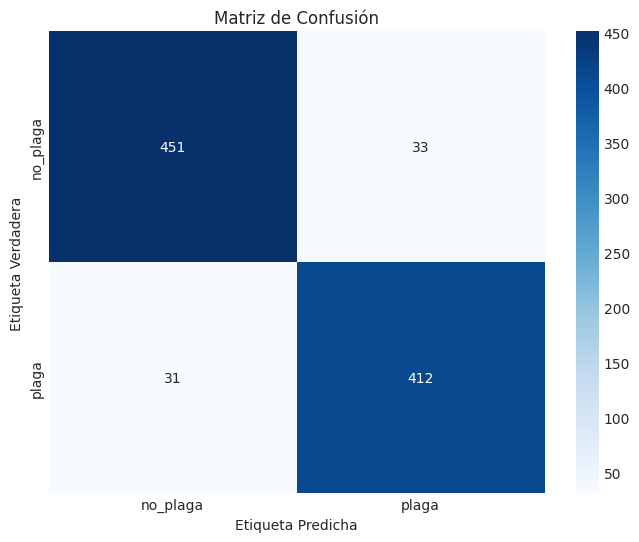

In [ ]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns

y_pred_probs = modelo.predict(X_val)
y_pred = (y_pred_probs >= 0.5).astype('int32')
y_true = y_val

cm = confusion_matrix(y_true, y_pred)

class_names = ['no_plaga', 'plaga']

plt.figure(figsize=(8,6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=class_names, yticklabels=class_names)
plt.xlabel('Etiqueta Predicha')
plt.ylabel('Etiqueta Verdadera')
plt.title('Matriz de Confusión')
plt.show()


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 721ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


/tmp/ipykernel_4543/277037566.py:21: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  pred_label = int(pred_probs >= 0.5)  # Convertir a entero


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


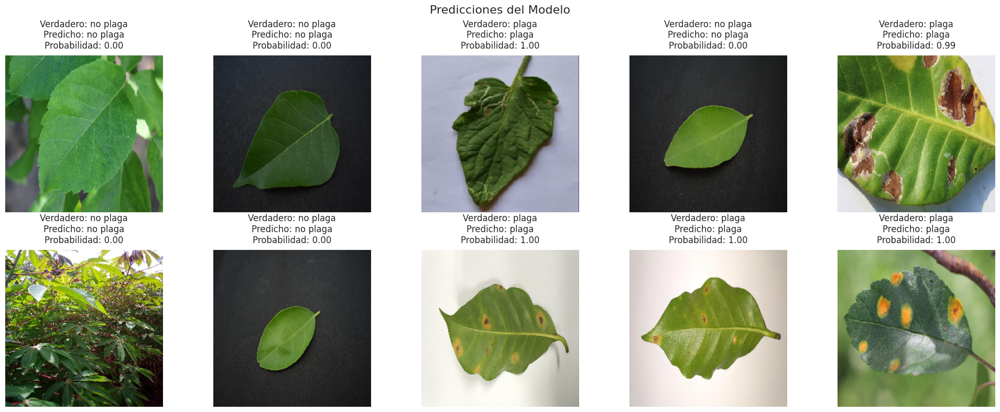

In [ ]:
import random
import matplotlib.pyplot as plt
import numpy as np

def visualizar_predicciones_binarias(X_val, y_val, modelo, class_names=['no plaga', 'plaga']):
    """
    Visualiza predicciones aleatorias del conjunto de validación.
    """
    indices = random.sample(range(len(X_val)), 10)
    
    fig, axes = plt.subplots(2, 5, figsize=(20, 8))
    fig.suptitle('Predicciones del Modelo', fontsize=16)
    
    for i, idx in enumerate(indices):
        img = X_val[idx]
        true_label = int(y_val[idx]) 
        pred_probs = modelo.predict(np.expand_dims(img, axis=0))
        pred_label = int(pred_probs >= 0.5)  
        
        prob_pos = pred_probs[0][1] if pred_probs.shape[1] > 1 else pred_probs[0][0]
        
        ax = axes[i // 5, i % 5]
        
        ax.imshow(img)
        ax.axis('off')
        
        title = (
            f"Verdadero: {class_names[true_label]}\n"
            f"Predicho: {class_names[pred_label]}\n"
            f"Probabilidad: {prob_pos:.2f}"
        )
        ax.set_title(title, pad=10)
    
    plt.tight_layout()
    plt.show()

visualizar_predicciones_binarias(X_val, y_val, modelo)

🔬 Analizando errores del modelo en el set de validación...
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step
📉 Se encontraron 64 errores de clasificación.


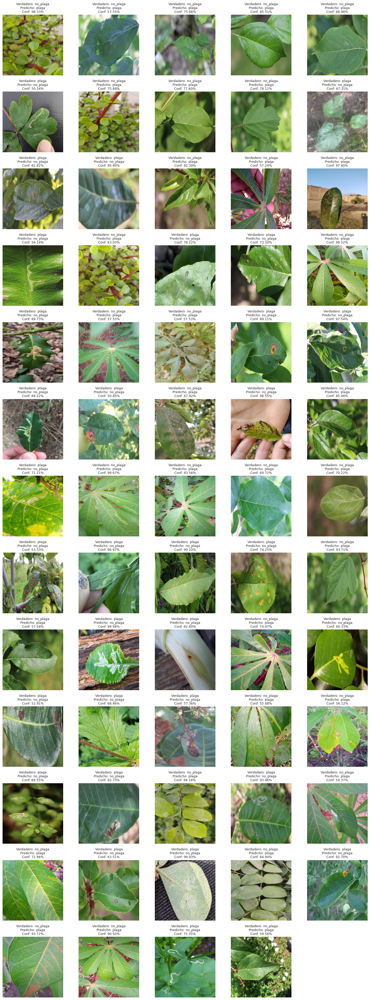

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

def visualizar_errores(modelo, X_val, y_val, class_names):
    """
    Identifica y visualiza las imágenes que el modelo clasificó incorrectamente.
    Versión final robusta para clasificación binaria.
    """
    print("Analizando errores del modelo en el set de validación...")
    
    y_pred_probs = modelo.predict(X_val)
    y_pred_class = (y_pred_probs > 0.5).astype("int").flatten()
    y_true_class = y_val.astype("int")


    error_indices = np.where(y_pred_class != y_true_class)[0]
    
    if len(error_indices) == 0:
        print("No hay errores")
        return
        
    print(f"Se encontraron {len(error_indices)} errores de clasificación.")
    
    error_images = X_val[error_indices]
    error_true_labels = y_true_class[error_indices]
    error_pred_labels = y_pred_class[error_indices]

    probs_of_errors = y_pred_probs[error_indices].flatten()
    error_pred_probs = [p if pred == 1 else 1-p for p, pred in zip(probs_of_errors, error_pred_labels)]

    n_cols = 5
    n_rows = (len(error_indices) + n_cols - 1) // n_cols
    
    plt.figure(figsize=(15, 3 * n_rows))
    for i in range(len(error_indices)):
        plt.subplot(n_rows, n_cols, i + 1)
        plt.imshow(error_images[i])
        
        true_label_name = class_names[error_true_labels[i]]
        pred_label_name = class_names[error_pred_labels[i]]
        pred_prob = error_pred_probs[i]
        
        plt.title(f"Verdadero: {true_label_name}\nPredicho: {pred_label_name}\nConf: {pred_prob:.2%}", fontsize=9)
        plt.axis('off')
        
    plt.tight_layout()
    plt.show()

class_names_plagas = ['no_plaga', 'plaga']
visualizar_errores(modelo, X_val, y_val, class_names_plagas)

In [20]:
modelo.save("modelo_plagas_binariov2.h5")